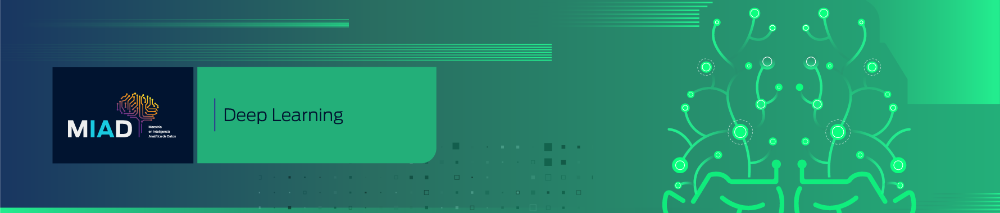

# Aplicaciones de Redes Convolucionales
## Localización de objetos

### Propósito 

La localización/detección de objetos es una de las principales aplicaciones de la visión artificial (_computer vision_) que involucra la identificación de varios objetos en imágenes o videos digitales. A diferencia del reconocimiento de imágenes que hemos trabajado anteriormente, la detección involucra dos pasos esenciales: 1. la identificación de los objetos presentes en una imagen y 2. la determinación de la posición exacta del objeto dentro de la imagen. La detección se realiza ubicando un cuadro delimitador (_bounding box_) que envuelve al objeto e indica su nombre:

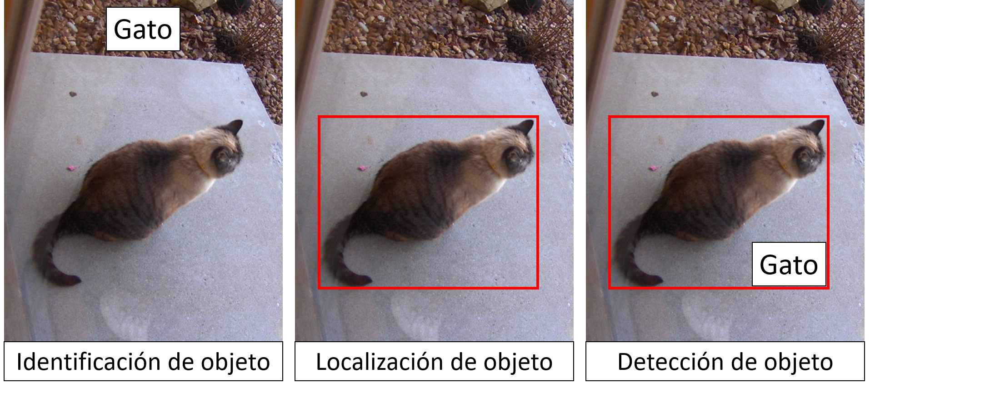

En este notebook se presentará la contextualización del problema, cómo es abordado por diferentes técnicas de Deep Learning y se enfocará en el funcionamiento del algoritmo YOLO (**Y**ou **O**nly **L**ook **O**nce), con el cual se mostrará la implementación de una red pre-entrenada para realizar la detección de objetos de una imagen particular. Finalmente, se presenta una actividad de calificación automática que será evaluada.

### Instrucciones generales
1. Cuando se le solicite declarar una estructura de datos debe usar el nombre exigido.
2. Utilice estrictamente los tipos de datos y nombres de variable indicadas en los enunciados de los ejercicios.
3. Evite crear, eliminar o modificar celdas de este notebook (salvo lo que se le indique) pues puede afectar el proceso de calificación automático.  

### Algoritmos para detección de objetos

Los tres principales algoritmos de esta aplicación son _Region-based Convolutional Neural Network_ (**R-CNN**), _Single Shot Detector_ (**SSD**) y **YOLO**. El primer algoritmo usa una red neuronal que sugiere regiones potenciales sobre las cuales se identificarán los objetos; posteriormente, utiliza una segunda red que se encarga de clasificar y detectar los objetos, para luego determinar el objeto correspondiente a cada pixel de la imagen original y dar forma al objeto que necesita ser detectado:

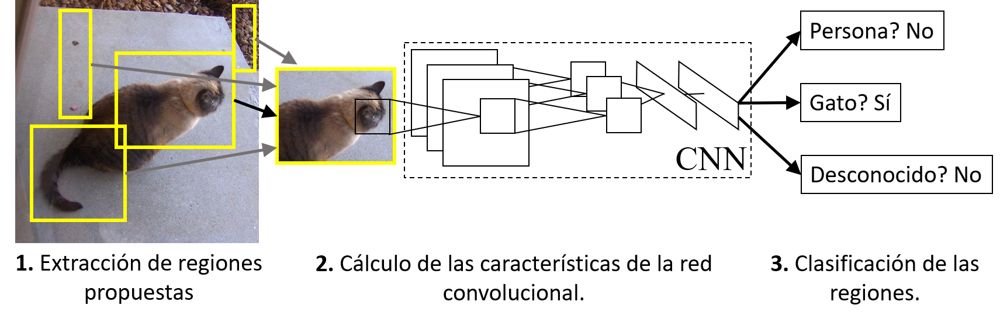

Existen versiones más rápidas de este algoritmo como Faster R-CNN, el cual es el estado del arte en visión artificial en términos de precisión. Sin embargo, también es el más demorado con capacidad de procesamiento de 7 imágenes por segundo, lo cual es insuficiente para detección en video (tiempo real). El algoritmo **SSD** acelera este proceso eliminando la necesidad de una red que proponga regiones: en primer lugar, se utiliza una primera red para extraer mapas de características (_feature maps_) de la imagen (generalmente se usa **VGG16**), reduciendo la cantidad de información a analizar; luego, se aplican filtros convolucionales para detectar objetos. Para este último paso, se divide el mapa de características en una malla (_grid_) compuesto de celdas sobre las cuales se prueban varios cuadros delimitadores predefinidos y las clases que representan los objetos. Se realiza una predicción por cada celda con el cuadro delimitador y la clase con mayor puntaje. La idea se ilustra en la siguiente imagen:

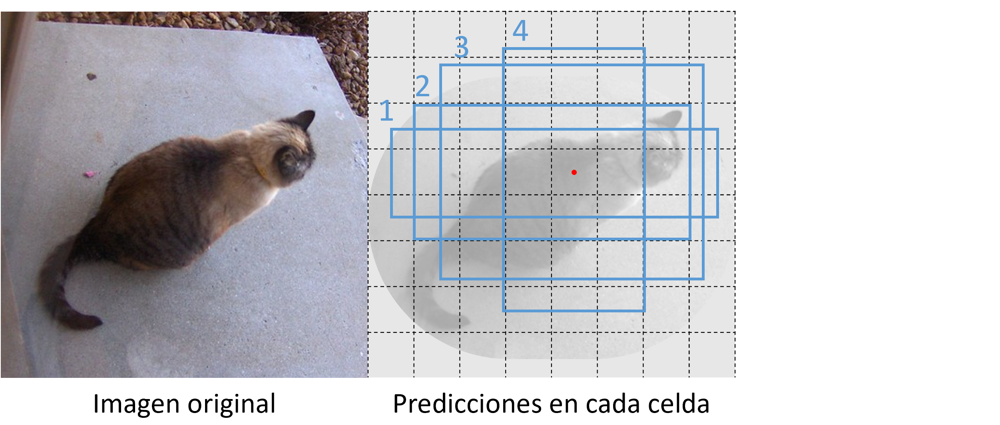

SSD es una familia de algoritmos con variaciones que permiten alcanzar distintas precisiones, lo cual se logra generando convoluciones adicionales tanto en la creación de mapas de características como de predicciones de cuadros delimitadores. Retina-Net es una versión de SSD considerada el estado del arte de esta técnica.

Finalmente, el algoritmo **YOLO** posee la arquitectura más simple pero a la vez más robusta y eficiente, la cual le permite realizar detecciones de objetos en tiempo real gracias a su bajo consumo de memoria. Debido a la popularidad y versatilidad de este algoritmo, nos enfocaremos en su funcionamiento y aplicación.

### YOLO: Descripción y funcionamiento

Este algoritmo es similar a SSD en la idea de dividir la imagen en una _grid_ NxN, aunque con un paradigma de detección bastante diferente: los cuadros delimitadores se tratan como un problema de **regresión** donde se determinan sus dimensiones, ubicación y las probabilidades de la clases (objetos) que contiene cada cuadro de la malla a través de una red convolucional. Esta adaptación permite que la imagen sea analizada en un solo paso de forma rápida (como indica el nombre del algoritmo). El algoritmo consiste de cuatro pasos:
1. Bloques residuales
2. Regresión de cuadros delimitadores
3. Intersección sobre unión de cuadros (IoU)
3. Supresión de no-máximos

#### 1. Bloques residuales
En primer lugar, se define una malla (generalmente cuadrada NxN), donde cada una de las celdas se denomina como _bloque residual_. Cada una de estas celdas contiene una cantidad de pixeles fijas dependiendo de la precisión requerida, por lo que la imagen original puede ser alterada cortando los extremos, deformándola (expandiendo o contrayendo las dimensiones) o incluso se puede aplicar un _padding_ para ajustarla a una malla determinada. 

Luego de determinar las celdas de la cuadrícula, cada una será responsable de localizar y predecir la clase del objeto con mayor probabilidad que cubre. Esto evidencia una limitante para el algoritmo básico de YOLO pues quiere decir que sólo se puede identificar un objeto por celda. Para solucionar esto, versiones recientes de YOLO realizan predicciones **multiescala**, donde se prueban mallas de distinto refinamiento de forma que se pueden identificar varios objetos de distintos tamaños en la misma zona:

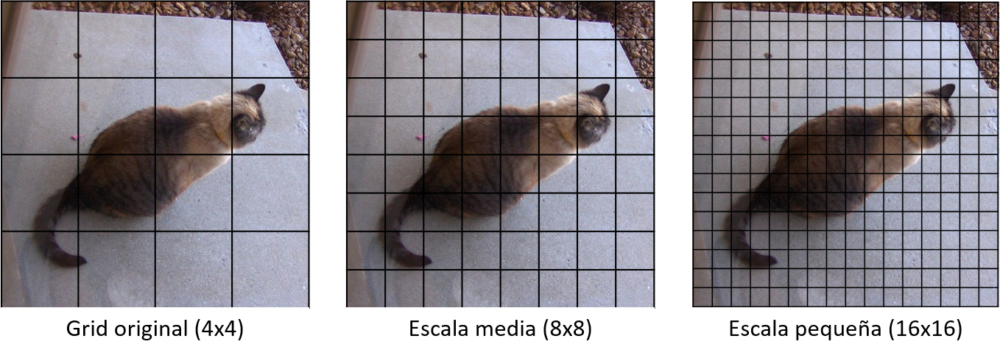

#### 2. Regresión de cuadros delimitadores

El siguiente paso es determinar los cuadros delimitadores que corresponden a rectángulos que resaltan todos los objetos de la imagen. Podemos tener tantos cuadros delimitadores como objetos haya dentro de una imagen dada. YOLO determina los atributos de estos cuadros delimitadores utilizando un único módulo de regresión en el siguiente formato, donde la variable de salida $Y$ es una representación vectorial que contiene las siguientes variables para cada cuadro delimitador:

$$Y=[p_c,b_x,b_y,b_h,b_w,\textbf{c}]$$
Estas variables son importantes para el proceso de entrenamiento de la red neuronal y se definen de la siguiente manera:
* $p_c$ corresponde a una puntuación dada a cada celda con la probabilidad de que esta contenga un objeto.
* $b_x$, $b_y$ son las coordenadas $x$ e $y$ de el centro del cuadro delimitador con respecto a la celda relacionada.
* $b_h$, $b_w$ a la altura y el ancho del cuadro delimitador con respecto a la celda relacionada.
* $\textbf{c}$ considera todas las clases correspondientes a cada objeto. Se tienen tantas clases como objetos con las que se entrena la red neuronal.

#### 3. Intersección sobre Uniones (IoU)

Generalmente, un mismo objeto en una imagen puede tener múltiples candidatos de _bounding boxes_ para predicción, pero no todas son relevantes. Para solucionar esto se calcula el IoU, un número entre 0 y 1 que permite descartar cajas irrelevantes siguiendo esta estrategia:
* El usuario define el límite de selección en términos de IoU, el cual suele ser 0.5.
* Luego, YOLO calcula el IoU para cada celda el cual se define como el área de intersección de las _bounding boxes_ dividida por el área de unión.
* Finalmente, se ignora la predicción de las celdas que tienen un IoU menor e igual al límite establecido anteriormente, mientras conserva aquellos que superen este límite.

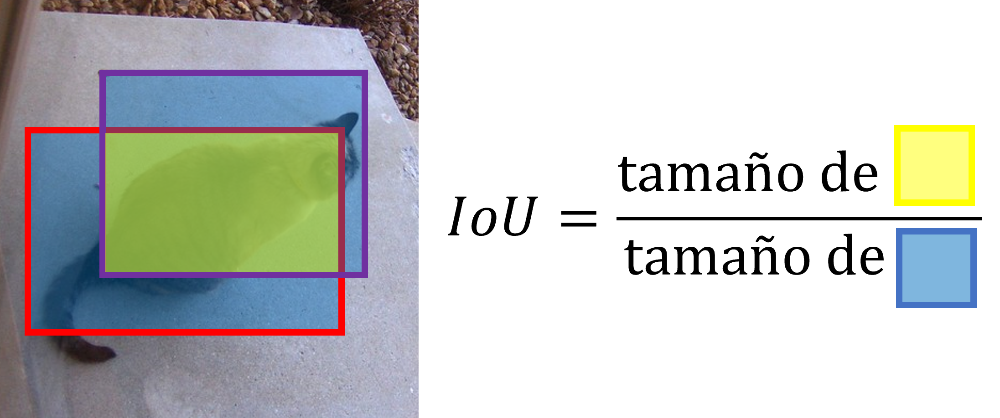

#### NMS - Non Max Supression

Este es el paso final que se encarga de eliminar _bounding boxes_ redundantes al mismo objeto que no se eliminaron en el paso de IoU. Para lograr esto, se mantienen las cajas con la probabilidad más alta de predicción en la detección:

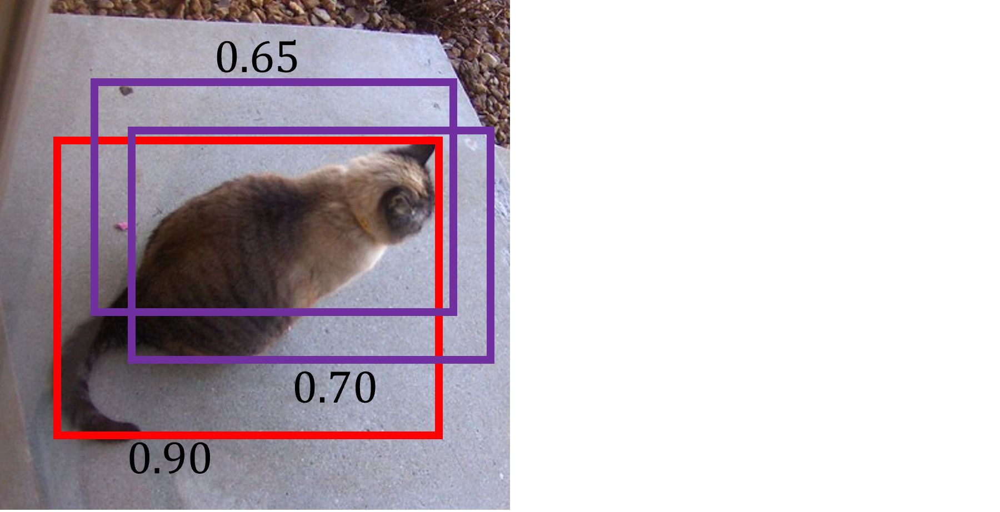

### Librerías a importar
A continuación se muestran los comandos a ejecutar para poder implementar los procedimientos de este notebook:

In [3]:
import sys
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2
import torch

### Detección con YOLO v7

A continuación, clonaremos el código disponible en GitHub con todas las funciones requeridas para ejecutar YOLO en su versión 7. Además de las herramientas de detección, que son las que usaremos en este laboratorio, hay otras funcionalidades y una amplia documentación que incluye el paper que origina esta versión del algoritmo:

In [4]:
# Verifica que ya existe la carpeta y clona YOLOv7 en caso que no
![ -d "$yolov7/" ] && git clone https://github.com/WongKinYiu/yolov7 || echo "Ya existe el directorio. Continúe ejecutando."
!cp yolov7.pt ./yolov7
%cd yolov7
!ls

fatal: destination path 'yolov7' already exists and is not an empty directory.
Ya existe el directorio. Continúe ejecutando.
/home/jovyan/work/release/S6LC3/yolov7
cfg	   export.py   LICENSE.md  requirements.txt  tools	      utils
data	   figure      models	   runs		     traced_model.pt  yolov7
deploy	   hubconf.py  paper	   scripts	     train_aux.py     yolov7.pt
detect.py  inference   README.md   test.py	     train.py


En la pestaña "Archivos de laboratorio" puede verificar la descarga de una carpeta denominada `yolov7`. Dentro de esta carpeta se editarán los archivos necesarios para realizar la detección de objetos. Tenga en cuenta que si realizó esta clonación anteriormente, obtendrá el mensaje: `fatal: destination path 'yolov7' already exists and is not an empty directory.`, esto simplemente indica que ya existe la carpeta y no se volverá a realizar la clonación.

A continuación, copiaremos una imagen previamente descargada del repositorio de Universidad de los Andes y la moveremos a la carpeta `inference/images`. Todas las imagenes sobre las cuales se quiera aplicar el algoritmo se deben encontrar en esta dirección.

In [5]:
!cp ../uso-bicicleta-n.jpg inference/images/

Con la siguiente línea, se realiza la detección de objetos sobre la imagen deseada (el proceso toma poco más de un minuto, mientras se configura el modelo la primera vez):

In [6]:
# Detection
!python detect.py --weights yolov7.pt --img-size 640 --source inference/images/uso-bicicleta-n.jpg --save-txt

Namespace(weights=['yolov7.pt'], source='inference/images/uso-bicicleta-n.jpg', img_size=640, conf_thres=0.25, iou_thres=0.45, device='', view_img=False, save_txt=True, save_conf=False, nosave=False, classes=None, agnostic_nms=False, augment=False, update=False, project='runs/detect', name='exp', exist_ok=False, no_trace=False)
YOLOR 🚀 v0.1-128-ga207844 torch 2.3.0+cu121 CPU

Fusing layers... 
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
Model Summary: 306 layers, 36905341 parameters, 6652669 gradients
 Convert model to Traced-model... 
 traced_script_module saved! 
 model is traced! 

10 persons, 7 bicycles, 6 backpacks, Done. (2010.4ms) Inference, (1.4ms) NMS
 The image with the result is saved in: runs/detect/exp4/uso-bicicleta-n.jpg
Done. (2.255s)


Ahora, mostraremos la imagen con los cuadros delimitando e indicando cada objeto sobre la imagen original con la siguiente función:

In [7]:
# define helper functions to show images
def imShow(path):
    %matplotlib inline
    image = cv2.imread(path)
    height, width = image.shape[:2]
    resized_image = cv2.resize(image,(3*width, 3*height), interpolation = cv2.INTER_CUBIC)
    
    fig = plt.gcf()
    fig.set_size_inches(18, 10)
    plt.axis("off")
    plt.imshow(cv2.cvtColor(resized_image, cv2.COLOR_BGR2RGB))
    plt.show()

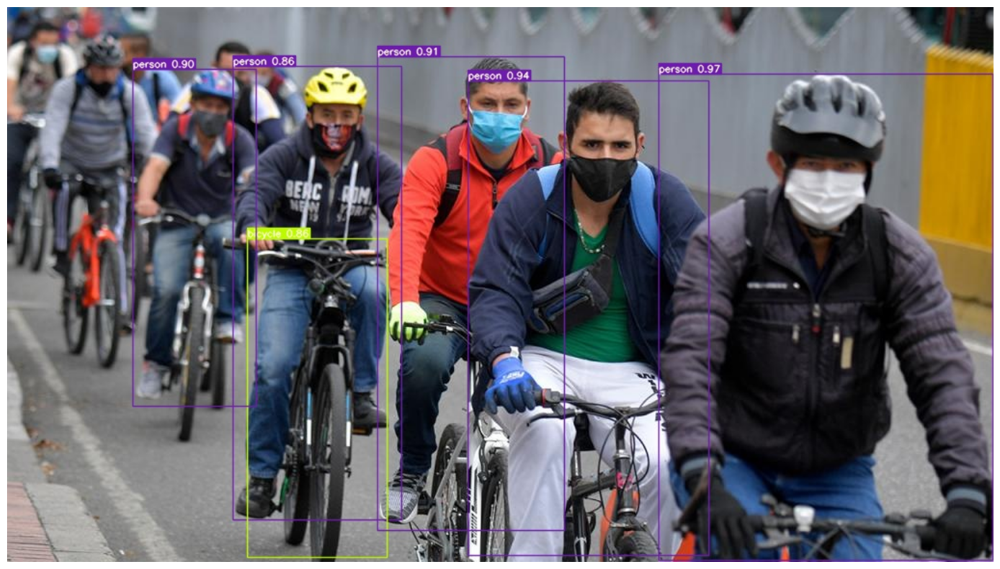

In [8]:
imShow("runs/detect/exp/uso-bicicleta-n.jpg")

Tenga en cuenta que cada vez que realiza una detección, se crea una carpeta nueva llamada `exp` en `runs/detect`. Cada vez que haga una ejecución se creará una nueva carpeta con el nuevo resultado aumentando el índice (`exp2`, `exp3`, etc).

Detallemos algunas capacidades del algoritmo sobre esta imagen:
* Fue capaz de detectar las diez personas presentes en la imagen, incluyendo las que están atrás difuminadas por la distancia o sólo se distinguen una parte de ellas. También note que el uso de tapabocas, casco y ropa no afectó la identificación.
* Las siete bicicletas que se alcanzan a ver, aunque parcialmente, son identificadas. Note que de la bicicleta del frente solo se ve el manubrio, aún así es reconocida (aunque con una probabilidad de 0.45).
* El algoritmo reconoce los bolsos que llevan los ciclistas. Esto es particularmente interesante, pues lo único que observamos de las maletas son las hombreras, aún así, YOLO es capaz de reconocerlo.
* Otros elementos que no son reconocidos son prendas de vestir, los tapabocas y cascos. Esto es debido a que el algoritmo se entrenó con la base de datos *COCO*. Se sugiere revisar las clases disponibles en la dirección `yolov7/data/coco.yaml`.

### Actividad auto-calificada

El modelo cargado permite establecer varios parámetros de interés, como la probabilidad de predicción (_confidence_) desde la cual se decide si un objeto es detectado, o el límite inferior de IoU, con el cual se seleccionan las _bounding boxes_ definitivas que delimitan a los objetos identificados. Revise la documentación en el archivo `detect.py` para conocer cómo establecer valores para los parámetros mencionados anteriormente y realice las detecciones solicitadas a continuación conservando siempre el siguiente inicio de la línea de código: `!python detect.py --weights yolov7.pt --img-size 640 --source inference/images/uso-bicicleta-n.jpg --save-txt`

In [9]:
#Ejecute las siguientes líneas siempre antes de las líneas de código de su solución
!rm -r runs/detect
!mkdir runs/detect

Ejecute un modelo con los parámetros por defecto excepto la probabilidad mínima de predicción, que debe ser igual a $0.85$:

In [10]:
# your code here
!python detect.py --weights yolov7.pt --img-size 640 --source inference/images/uso-bicicleta-n.jpg --save-txt --conf 0.85

Namespace(weights=['yolov7.pt'], source='inference/images/uso-bicicleta-n.jpg', img_size=640, conf_thres=0.85, iou_thres=0.45, device='', view_img=False, save_txt=True, save_conf=False, nosave=False, classes=None, agnostic_nms=False, augment=False, update=False, project='runs/detect', name='exp', exist_ok=False, no_trace=False)
YOLOR 🚀 v0.1-128-ga207844 torch 2.3.0+cu121 CPU

Fusing layers... 
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
Model Summary: 306 layers, 36905341 parameters, 6652669 gradients
 Convert model to Traced-model... 
 traced_script_module saved! 
 model is traced! 

5 persons, 1 bicycle, Done. (1917.5ms) Inference, (1.9ms) NMS
 The image with the result is saved in: runs/detect/exp/uso-bicicleta-n.jpg
Done. (2.118s)


Ejecute un modelo con los parámetros por defecto excepto la probabilidad mínima de predicción, que debe ser igual a $0.15$:

In [11]:
# your code here
!python detect.py --weights yolov7.pt --img-size 640 --source inference/images/uso-bicicleta-n.jpg --save-txt --conf 0.15

Namespace(weights=['yolov7.pt'], source='inference/images/uso-bicicleta-n.jpg', img_size=640, conf_thres=0.15, iou_thres=0.45, device='', view_img=False, save_txt=True, save_conf=False, nosave=False, classes=None, agnostic_nms=False, augment=False, update=False, project='runs/detect', name='exp', exist_ok=False, no_trace=False)
YOLOR 🚀 v0.1-128-ga207844 torch 2.3.0+cu121 CPU

Fusing layers... 
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
Model Summary: 306 layers, 36905341 parameters, 6652669 gradients
 Convert model to Traced-model... 
 traced_script_module saved! 
 model is traced! 

10 persons, 7 bicycles, 6 backpacks, 1 handbag, Done. (1847.2ms) Inference, (2.3ms) NMS
 The image with the result is saved in: runs/detect/exp2/uso-bicicleta-n.jpg
Done. (2.119s)


Ejecute un modelo con los parámetros por defecto excepto el límite inferior de IoU, que debe ser igual a $0.1$:

In [12]:
# your code here
!python detect.py --weights yolov7.pt --img-size 640 --source inference/images/uso-bicicleta-n.jpg --save-txt --iou-thres 0.1

Namespace(weights=['yolov7.pt'], source='inference/images/uso-bicicleta-n.jpg', img_size=640, conf_thres=0.25, iou_thres=0.1, device='', view_img=False, save_txt=True, save_conf=False, nosave=False, classes=None, agnostic_nms=False, augment=False, update=False, project='runs/detect', name='exp', exist_ok=False, no_trace=False)
YOLOR 🚀 v0.1-128-ga207844 torch 2.3.0+cu121 CPU

Fusing layers... 
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
Model Summary: 306 layers, 36905341 parameters, 6652669 gradients
 Convert model to Traced-model... 
 traced_script_module saved! 
 model is traced! 

7 persons, 7 bicycles, 6 backpacks, Done. (1892.1ms) Inference, (1.5ms) NMS
 The image with the result is saved in: runs/detect/exp3/uso-bicicleta-n.jpg
Done. (2.200s)


A modo de verificación, esta última operación debería dar que sólo se detectaron 7 personas, 7 bicicletas y 6 backpacks. Como se puede notar, se reconocen menos personas en esta ocasión, lo cual es debido a que un mayor valor de IoU hace que se eliminen cuadros muy cercanos que comparten una proporción de área de 0.1 o mayor, lo cual afecta a la identificación de personas que están juntas en la imagen:

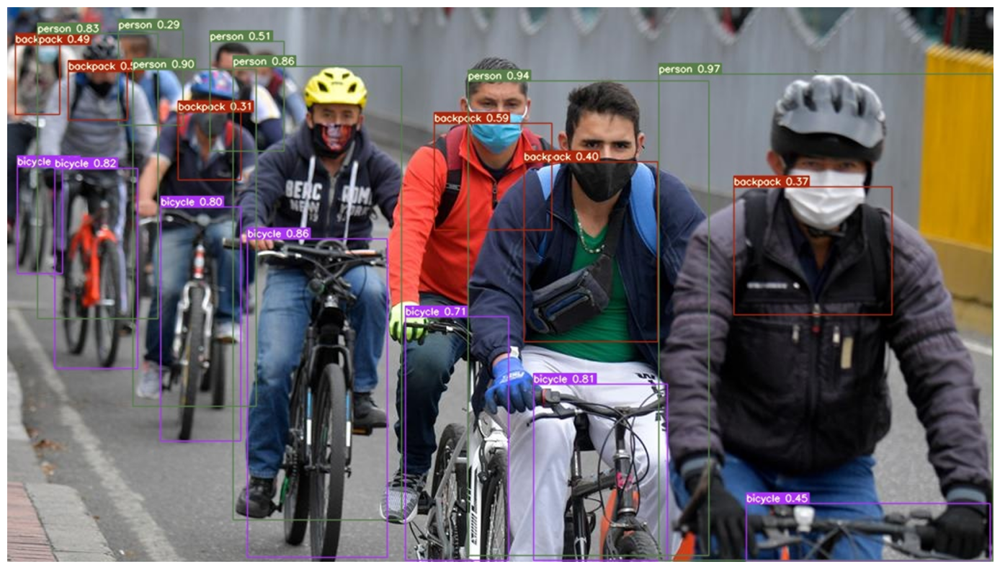

In [13]:
imShow("runs/detect/exp3/uso-bicicleta-n.jpg")

In [ ]:
#Pruebas ocultas para calificación de punto 1

In [ ]:
#Pruebas ocultas para calificación de punto 2

In [ ]:
#Pruebas ocultas para calificación de punto 3